# 용종 검출 세그멘테이션 모델 개발
강사: 진태헌\
프로젝트 번호: 2

# 목차

1. 프로젝트 개요
	1. 프로젝트 연구 배경 
    1. DUCK‑Net architecture
    1. Duck-Net의 기대 효과
1. 실습 환경 설정
	1. 엘리스 클라우드 가입
	1. 인스턴스 생성
	1. 인스턴스 삭제
    1. 인스턴스 접속(SSH)
    1. 버전 확인
	1. 코드 업로드
    1. 패키지 설치
1. 데이터셋 준비
    1. 데이터셋 소개
    1. 데이터셋 다운로드
    1. 데이터셋 압축 해제
    1. 데이터셋 시각화
1. 모델 구축
    1. 라이브러리 설명
    1. 파라미터 및 경로 설정
    1. 데이터셋 전처리
    1. 모델 구성
	1. 모델 정의
1. 모델 학습
	1. 모델 인스턴스화 및 컴파일
	1. 학습 루프 구현
	1. 결과 저장
1. 모델 실험 결과
	1. 예측 및 성능 평가
	1. 예측 결과 시각화
	1. 손실 그래프
    1. 결과 분석
1. 결론
	1. 주요 업적
	1. 기존 연구와의 차별점
	1. 기술적 한계
	1. 향후 연구 과제


# 프로젝트 개요

### 논문 : `Using DUCK-Net for polyp image segmentation`
저자 : `Razvan‑Gabriel Dumitru, Darius Peteleaza, Catalin Craciun`\
게재 저널명 : `Nature Scientific Reports`\
예상 모델 학습 소요시간: `30분`\
컴퓨팅 성능 요구: `보통`\
소스코드 원본 주소: `https://github.com/RazvanDu/DUCK-Net`

## 프로젝트 연구 배경

`현장 문제 : 대장내시경 검사의 정확성 문제`
- 대부분의 **대장암(Colorectal Cancer, CRC)** 은 선종성 용종에서 시작되기 때문에 조기 발견과 제거가 암 예방의 핵심
- 현재 내시경을 통한 대장 용종 진단은 가장 보편적이고 효과적인 방법이지만 용종의 다양성(형태, 크기, 질감 등) 때문에 의사의 시각적 한계로 인해 놓치거나 오진될 가능성이 존재 
- 이는 환자에게 심각한 건강상의 위협으로 이어질 수 있음



`사회적 문제 : 암 사망률 감소를 위한 의료 AI의 필요성`
- CRC는 전 세계적으로 높은 사망률을 보이는 암 중 하나이며 의료 인력의 숙련도에 따라 진단 정확도가 크게 달라지는 문제가 있음 
- 이로 인해 객관적이고 일관된 진단을 보조할 수 있는 인공지능 기반 기술의 필요성이 강조 
- 특히 수작업으로 의료 데이터를 라벨링하는 데 큰 비용과 시간이 소요되므로 소량의 데이터로도 효과적으로 학습할 수 있는 모델 개발은 의료현장에서 매우 중요

`기술 동향 : 의료영상 분할을 위한 딥러닝의 진화`
- 의료영상 처리 분야에서는 U-Net, FCN, DeepLabV3+, ResUNet++ 등 다양한 CNN 기반 모델들이 제안되어 왔으며 이들은 일정 수준의 정확도를 달성했지만 여전히 복잡하거나 다양한 형태의 용종에서는 성능이 불안정하다는 한계가 있음 
- 최근에는 Transformer 기반 모델도 등장했지만 과도한 연산량과 데이터 요구량으로 인해 실제 의료현장에서의 활용에는 제약이 있음
    

## `DUCK‑Net architecture`

- 대장내시경 영상에서 용종을 정확하게 세그멘테이션 하기 위한 새로운 컨벌루션 신경망 기반의 모델인 DUCK-Net을 제안 
- 해당 모델은 기본적으로 U-Net의 인코더-디코더 구조를 기반으로 하며 `세 가지` 주요 구조적 차별점을 통해 기존 방식보다 성능을 향상시키는 것을 목표
#### 1. 기존 U-Net에서 사용되던 3×3 합성곱 블록 대신 본 연구에서는 DUCK(Deep Understanding Convolutional Kernel) 블록을 도입 
- DUCK 블록은 다양한 커널 크기를 모사하는 여섯 가지 서로 다른 합성곱 구조를 병렬로 적용하는 방식으로 구성 
- 이로 인해 모델은 특정 구조에 국한되지 않고 입력 이미지의 특성에 따라 가장 적합한 경로를 선택하여 학습할 수 있게 됨 
- 구체적으로 Residual block을 기반으로 한 1개, 2개, 3개 블록 조합과 dilated convolution을 이용한 midscope, widescope 블록, 그리고 분리된 1×N, N×1 커널 조합을 포함 
- 이러한 구성은 모델이 낮은 수준의 세부 특징부터 넓은 범위의 고수준 특징까지 동시에 포착할 수 있도록 함

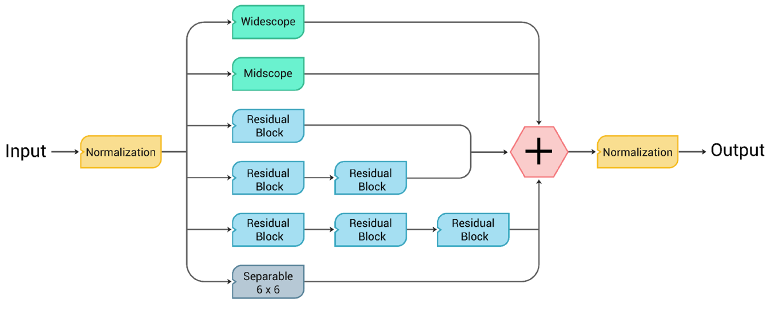
<center>Duck 블록</center>


#### 2. DUCK 블록에서 발생할 수 있는 세부 정보 손실 문제를 해결하기 위해 보조적인 다운스케일 경로 추가 
- 이 경로는 별도의 합성곱 연산 없이 이미지의 저수준 정보만을 보존하며 이를 메인 인코더 경로와 합산(addition) 방식으로 통합 
- 이는 일반적인 max pooling보다 효과적이며 세부적인 경계 정보 손실을 줄이는 데 기여

#### 3. 업샘플링 과정에서 기존의 concatenate 방식 대신 addition 방식을 채택 
- 이 방식은 연산량과 메모리 사용량을 줄이면서도 유사하거나 더 나은 성능을 보임 
- 이로 인해 디코더 부분에서는 인코더보다 절반 수준의 채널 수를 유지하도록 설계

또한 모델의 성능 향상을 위한 데이터 증강 기법도 함께 적용\
색상 변화, 기하학적 변환, 반전 등 다양한 방식이 적용되었으며 이를 통해 모델의 과적합을 방지하고 예측의 안정성을 확보\
그림은 논문에서 제안하는 Duck-Net의 전체 아키텍처

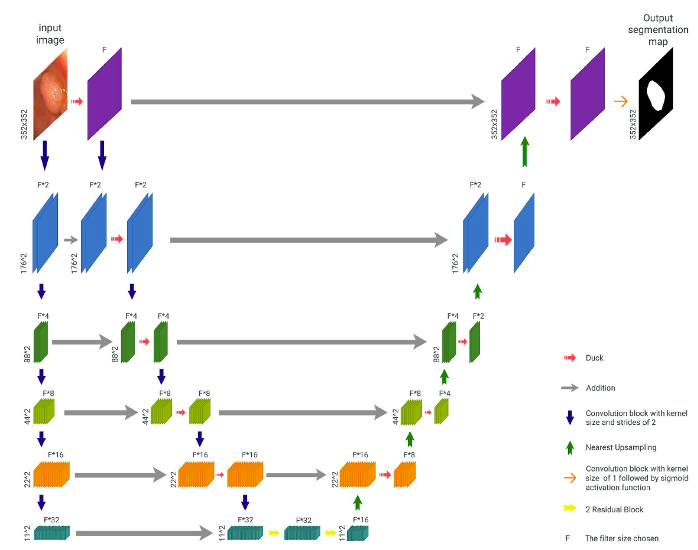
<center> DUCK‑Net architecture </center>


## `Duck-Net` 의 기대 효과

1. 조기 대장암 진단 정확도 향상

    - DUCK-Net은 다양한 크기와 모양, 질감을 가진 용종을 정확하게 분할할 수 있어 내시경 영상에서의 용종 검출 정확도 향상에 기여 
    - 이는 곧 조기 대장암 진단율을 높이고 생존율 향상 및 치료 비용 절감으로 이어질 수 있음

2. 의료 인력의 진단 보조 및 업무 효율화

    - DUCK-Net은 실시간 또는 사전 분석을 통해 의사의 판단을 보조할 수 있으며 다수의 이미지에서 자동화된 용종 검출을 가능하게 해 의료진의 부담을 줄이고 업무 효율을 극대화할 수 있음

3. 소량의 데이터로도 높은 정확도 구현

    - 이 모델은 사전 학습(pre-training) 없이도 소량의 의료 영상 데이터로 학습 및 일반화가 가능 
    - 이는 의료 영상 데이터 확보와 라벨링에 드는 비용과 시간을 크게 절감할 수 있음을 의미하며 특히 데이터가 부족한 병원이나 국가에서의 활용 가능성이 높음

4. 다양한 의료 영상 분야로 확장 가능

    - DUCK-Net의 아키텍처는 용종뿐 아니라, 간, 폐, 뇌 등 다른 기관의 병변 탐지 및 분할에도 적용 가능한 범용성을 지님 
    - 향후 다양한 의료 영상 분석 분야로 확장될 수 있어 의료 인공지능 기술의 확장성 및 산업적 가치가 높음

5. 현장 적용을 고려한 경량화와 효율성

    - DUCK-Net은 기존 모델 대비 메모리 효율성과 연산 최적화가 잘 되어 있어 향후 실제 병원 시스템 혹은 모바일/임베디드 환경에서의 활용 가능성도 높음


# 실습 환경 설정

## 엘리스 클라우드 가입

1. 엘리스 클라우드 가입 시 사용할 이메일 주소로 초대장이 보내짐
1. 이메일을 열어 초대장 메일을 확인

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/mail1.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

3. "`학습지 가기`"를 클릭하여 로그인 화면으로 이동

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/mail2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

4. 메일에 나와있는 이메일 아이디와 임시포스트를 입력하여 로그인

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/login.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

5. 사용할 비밀번호를 입력하고 필수 동의사항에 동의 후 회원가입 클릭

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/login2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

6. 회원가입 완료

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/login3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

## 인스턴스 생성

1. 왼쪽 상단의 LXP를 클릭한 뒤 클라우드를 클릭

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/cloud.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. 내 인스턴스 클릭

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/cloud2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

3. 인스턴스 생성을 클릭하여 생성 화면으로 이동

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/cloud3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

4. 인스턴스 유형으로 G-NAHP-80(A100 80GB PCle)을 선택

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/instance.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

5. 인스턴스 이름 작성 후 실행 환경은 Jupyter 선택

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/instance2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

6. 스토리지 옵션으로 `{프로젝트 용량 고려}`GB 선택\
주의: 본 프로젝트의 용량이 `{프로젝트 용량}`GB이므로 프로젝트 용량보다 더 큰 용량 선택
7. 이후 인스턴스 생성을 클릭해 생성을 완료

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/instance3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

8. 이제 생성된 인스턴스에서 실습을 진행함
1. 이후 내 인스턴스 페이지로 돌아가기 위해 왼쪽 상단의 내 인스턴스 클릭

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/instance4.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

## 인스턴스 삭제

- 인스턴스 화면에 없어도 인스턴스는 계속 실행되고 있으므로 삭제 필요
- 사용이 끝난 경우 반드시 ‘종료’ 버튼을 눌러 실행을 중지해야 함\
(단, 종료는 인스턴스에 여전히 필요한 데이터나 설정이 남아 있는 경우에만 사용)
- 인스턴스를 더 이상 사용할 일이 없다면, ‘삭제’를 통해 완전히 제거해야함
- 삭제는 반드시 인스턴스가 종료된 상태에서만 가능하며, 한 번 삭제하면 복구할 수 없음

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/instance5.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

## 인스턴스 접속(SSH)

### PEM 다운로드

> 주의: 한번 다운로드 받은 PEM 파일은 잘 보관해야 함\
> 재 발급 받은 경우 키 값이 달라지므로 재 발급 받은 파일로는 기존의 인스턴스에 접속 불가함\
> SSH 접속은 실습 환경에 필요한 모듈을 다운받는 등에 사용함

1. SSH 접속을 위해서는 비밀키 파일(PEM 파일) 필요\
비밀키 발급하기 클릭

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/key.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. SSH 접속을 위해서는 비밀키 파일(PEM 파일) 필요\
PEM 파일 다운로드하기를 클릭하여 PEM 파일 저장

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/key2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

### Command Prompt(혹은 Powershell) 실행

1. 윈도우(<span style="font-family: 'Wingdings';">&#xFF;</span>)  + R 키를 누르기
1. cmd 입력 (또는 powershell 입력)
1. Enter키 눌러서 Command Prompt 실행

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/key3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

4. "`cd [PEM파일 폴더 경로]`" 명령어를 사용하여 PEM 파일이 있는 위치로 이동\
예시: `cd %userprofile%\Downloads`\
(PEM 저장 위치 예시: 다운로드 폴더, 바탕화면, USB 등...)

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/key4.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

### SSH 접속 명령어

1. 내 인스턴스 페이지에서 다른 SSH 클라이언트 사용 선택

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/ssh.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. 빠른 연결칸의 명령어를 복사

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/ssh2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. 복사한 명령어를 앞서 실행한 powershell 또는 cmd에 붙여넣기

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/ssh3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

4. SSH 접속 완료, SSH 접속 창은 계속 사용 되므로 창을 닫지 않음

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/ssh4.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

## 버전 확인

### 논문에서 구성한 버전 정보

- `{논문에서 사용된 버전 언급, 환경은 인스턴스 생성할 때 설명하면 좋습니다.}`

### 파이썬 버전 확인

주피터 노트북에서 아래 명령어를 입력하여 확인하며 `엘리스 클라우드`의 주피터 노트북에 접속하여 입력함
> Tip: 파이썬 버전에 따라 텐서플로우 설치 가능 버전이 달라짐

1. 내 인스턴스에서 연결을 클릭하여 Jupyter notebook에 접속

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/version.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. 우측 상단 `new` 버튼 클릭후 `Python 3(ipykernel)` 버튼 클릭

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/version2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

3. 코드를 작성하여 파이썬 버전을 확인

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/version3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

In [ ]:
import sys
print('Python version', sys.version)

## 코드 업로드

### 주피터 노트북 웹 페이지에서 바로 업로드 하기

1. 내 인스턴스에서 연결을 클릭하여 Jupyter notebook에 접속

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/version.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. 우측 상단에 있는 `Upload` 버튼 클릭

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/upload1.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

3. 열기 대화창이 뜨면 다운 받은 주피터노트북 교육자료 파일(*.jpynb) 선택 후 `열기(O)` 클릭

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/upload2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

4. 파란색 `Upload` 버튼을 클릭하여 엘리스 클라우드 서버로 파일 업로드

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/upload3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

5. 업로드한 교육자료 파일을 클릭하여 파일 열기

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/upload4.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

6. 강사의 지도에 따라 교육 자료를 활용

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/upload5.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

## 패키지 설치

### Miniconda 설치

> 원활하게 다양한 실습환경을 구축하기 위해 Miniconda의 가상환경을 생성하여 실습을 진행

SSH 접속 후 아래의 명령어를 순차적으로 실행
- wget https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
- bash Miniconda3-latest-Linux-x86_64.sh
- source ~/.bashrc

1. 명령어 작성 예시

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/miniconda.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. Please, press Enter to continue가 나오면 Enter 키를 누른 후 Page Down 키를 눌러 가장 아래로 내려감

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/miniconda2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

3. Do you accept the license terms? [yes/no]가 나오며 yes 입력 후 Enter 키를 눌러 넘어감

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/miniconda2-1.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

4. You can undo this by running 'conda init --reverse $SHELL'? [yes/no]가 나오면 yes를 입력하여 Miniconda 설치 완료

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/miniconda2-2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

5. Miniconda 설치 완료\
source ~/.bashrc 를 입력하여 변경 사항을 적용

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/miniconda3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

### Conda 가상환경 생성 및 활성화

1. SSH에 가상환경 생성 명령어 작성
- conda create -n ducknet python=3.10
> conda create -n `가상환경 이름` python=`파이썬 버전`

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/CondaEnv.png?raw=true" width="900">
    <figcaption>가상환경 생성 명령어 작성 예시</figcaption>
</figure>

2. 가상 환경 실행
- conda activate ducknet
> conda activate `가상환경 이름`

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/CondaEnv2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

### Jupyter Notebook과 가상환경 연동

1. ipykernel 설치
- pip install ipykernel

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/CondaEnv3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. Jupyter Notebook에서 이 가상환경을 선택 가능한 커널로 등록
- python -m ipykernel install --user --name=`가상환경 이름` --display-name "`Jupyter에서 보여지는 이름`"

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/CondaEnv4.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

3. Jupyter Notebook에서 python3.8 버전으로 notebook 생성 가능

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/CondaEnv5.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

4. 기존에 생성된 notebook에서 커널 변경 가능

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/CondaEnv6.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

5. python 버전이 정상적으로 변경 되었는지 확인

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/CondaEnv7.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

In [3]:
import sys
print('Python version', sys.version)

Python version 3.10.16 (main, Dec 11 2024, 16:24:50) [GCC 11.2.0]


### CUDA 설정

1. 패키지 관리자 업데이트
- sudo apt-get update
<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/cuda1.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

2. CUDA Toolkit 설치
- sudo apt-get install -y cuda-toolkit-12-4
- `{sudo apt-get install -y cuda-toolkit-11-8 과 같이 프로젝트마다 호환되는 버전이 다를 수 있습니다. 이 부분에 대해서 유의 바랍니다.}`

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/cuda2.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

3. cuDNN 설치
- sudo apt-get install -y libcudnn9-cuda-12
- `{sudo apt-get install -y libcudnn8 과 같이 프로젝트마다 호환되는 버전이 다를 수 있습니다. 이 부분에 대해서 유의 바랍니다.}`

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/cuda3.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

### 필요한 라이브러리

`{필요한 라이브러리 설치는 SSH 환경에서 실행하도록 권장합니다.}`

`요구 사항`
- numpy==1.23.1
- tensorflow==2.10.0
- scikit-learn==1.1.1
- albumentations==1.2.1
- opencv-python==4.6.0.66
- matplotlib==3.5.2
- tqdm==4.64.0
- Pillow==9.2.0
- scikit-image==0.19.3
- keras==2.10.0

### 패키지 버전 및 설치 확인

`필요 라이브러리 설치 명령어`



가상환경이 활성화된 상태의 SSH에 입력

- pip install numpy==1.23.5 scikit-learn==1.1.1 albumentations==1.2.1 opencv-python==4.6.0.66 matplotlib==3.5.2 tqdm==4.64.0 Pillow==9.2.0 scikit-image==0.19.3 keras==2.10.0 tensorflow


---
# 데이터셋 준비

> 참고: 패키지 설치 이후 주피터 노트북 커널을 다시 시작하는 것이 좋습니다.

## 데이터셋 소개

### 용종 세그멘테이션에 가장 많이 사용되는 4가지의 데이터셋 사용 <br/>

Kvasir-SEG<br/>
- 의사가 직접 라벨을 달고 숙련된 소화기내과 전문의가 검증한 위장관 용종 이미지와 해당 세그멘테이션 마스크의 오픈 액세스 데이터셋
- 총 이미지 수: 1000장
- 해상도: 대부분의 이미지가 576x768 픽셀
- 포맷: JPEG 이미지 + PNG 마스크
- 마스크는 이진 이미지로 용종이 있는 부분은 흰색(255) 배경은 검정색(0)


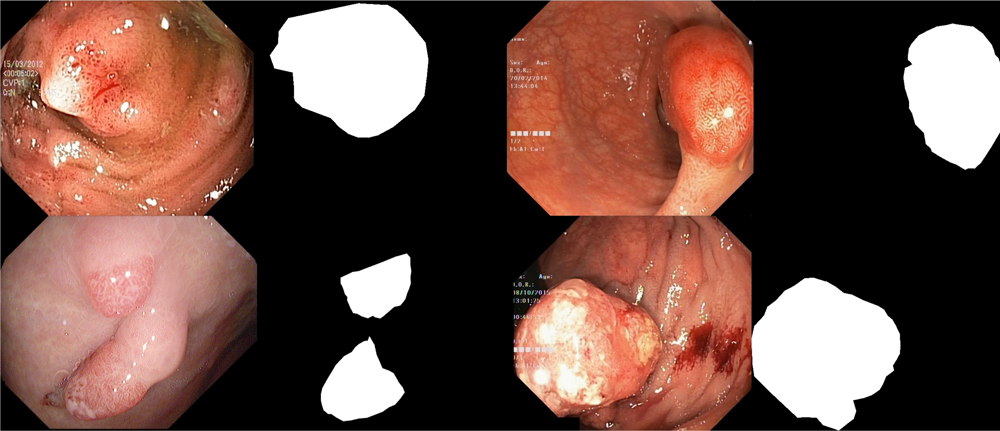
Kvasir-SEG  <br/><br/>


CVC-ClinicDB<br/>
- CVC-ClinicDB는 대장내시경 비디오에서 추출한 프레임의 데이터셋
- 프레임과 더불어 용종에 대한 실측 자료도 제공
- 총 이미지 수: 612장
- 해상도: 384×288 픽셀 (모두 동일한 크기)
- 마스크 포함: 각 이미지에 대해 용종의 정확한 마스크 제공


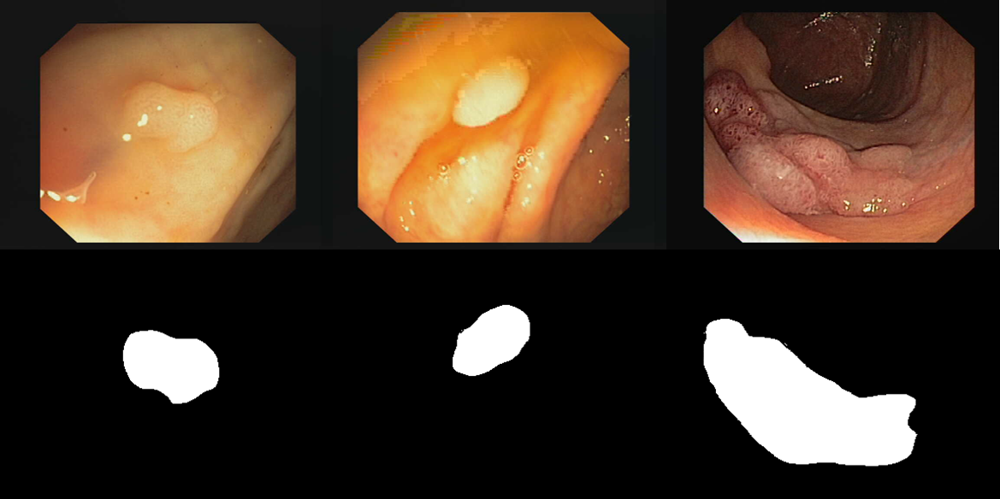
CVC-ClinicDB<br/><br/>

ETIS-LaribpolypDB<br/>
- 데이터 수는 적지만 작고 희미하거나 배경과 구분이 어려운 세그멘테이션 데이터
- 어려운 세그멘테이션 문제도 해결하는 능력을 검증
- 총 이미지 수: 196장
- 해상도: 약 1225×966 픽셀 (해상도는 이미지마다 약간 다름)

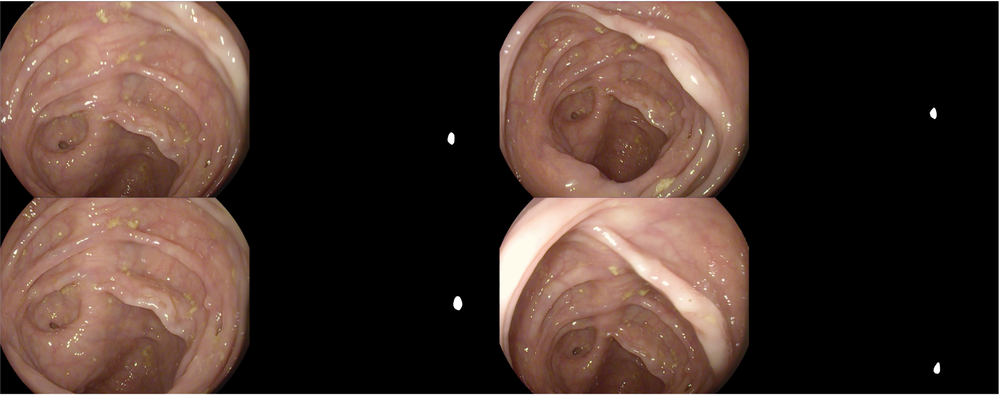
ETIS-LaribpolypDB<br/><br/>

CVC-ColonDB<br/>
- 용종의 모양, 위치, 크기가 매우 다양한 데이터셋
- CVC-ClinicDB 보다 조금 더 다양하고 어려운 케이스의 데이터를 포함
- 총 이미지 수: 380장
- 해상도: 574×500 픽셀

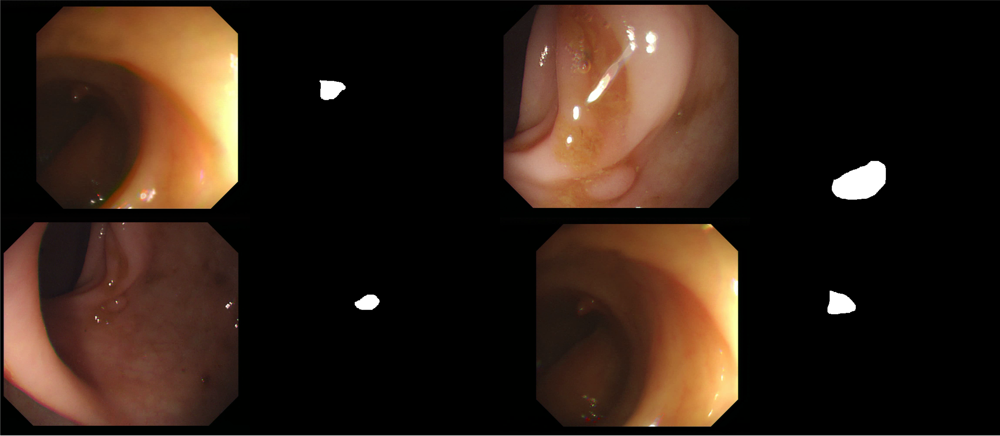
CVC-ColonDB<br/><br/>


## 데이터셋 다운로드

아래 구글 드라이브 링크를 통해 총 4가지의 데이터셋 다운로드
> 경고 : 다운 받고 파일의 압축을 푸시면 안됩니다

### [데이터셋 링크](https://drive.google.com/drive/folders/1Wyw0mkn05iky4Q9ALfr9RRigTX5NQS81?usp=share_link)

다운 받은 ZIP 파일을 Upload 를 통해 클라우드 환경 주피터 노트북에 업로드

<figure>
    <img src="https://github.com/KDT-ai/Book-Image/blob/main/image/cloud/upload1.png?raw=true" width="900">
    <!-- <figcaption></figcaption> -->
</figure>

## 데이터셋 압축 해제

데이터셋이 업로드된 경로 확인

In [ ]:
import os
print(os.getcwd())

데이터 압축 해제

In [ ]:
import zipfile
import os

zip_path = '/home/elicer/Kvasir-SEG.zip'  # 압축 파일 경로 위에서 확인한 결과 뒤에 /압축파일명 삽입
extract_to = '/home/elicer'    # 압축 해제할 디렉토리

# 압축 해제할 디렉토리가 없다면 생성
os.makedirs(extract_to, exist_ok=True)

# 압축 해제
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'압축 해제 완료: {extract_to}')

## 데이터셋 시각화

아래 소스코드는 Kvasir-SEG 데이터셋에 있는데이터를 무작위로 6개 골라서 보여주는 코드

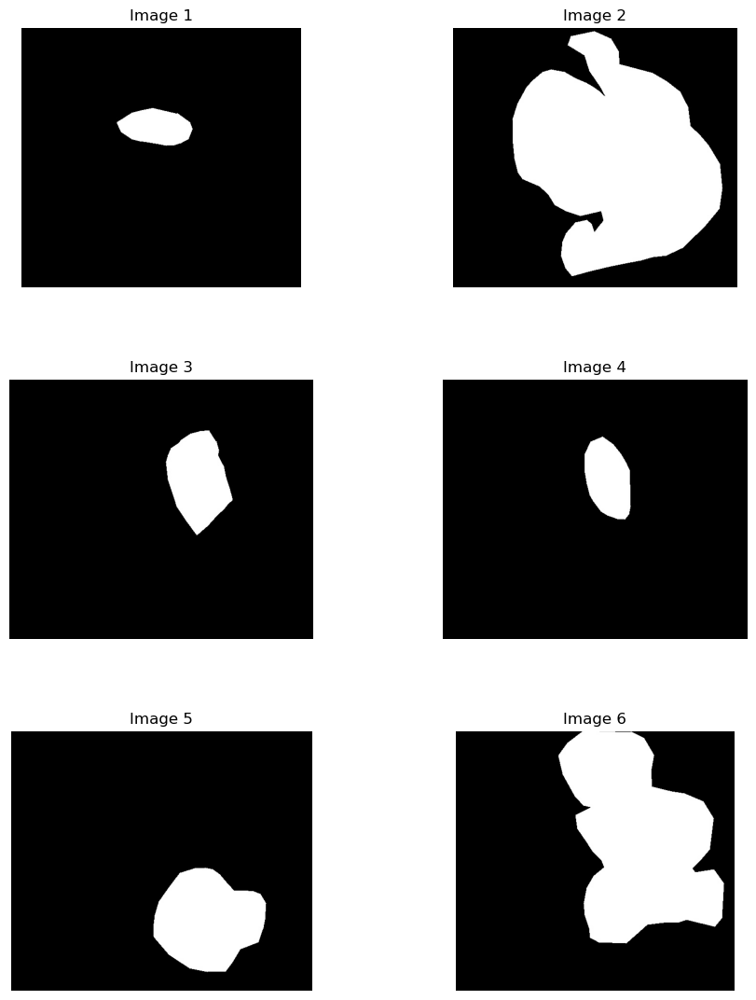

In [1]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# 이미지 경로 예시로 Kvasir-SEG 데이터셋 다른 데이터셋 사용시 이름 변경 바람
image_dir = "/home/elicer/Kvasir-SEG/images"
valid_extensions = ('.png', '.jpg', '.jpeg', '.tif', '.tiff')

# 이미지 파일 필터링
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(valid_extensions)]

# 무작위로 6개 이미지 선택
num_to_show = 6
sample_images = random.sample(image_files, min(len(image_files), num_to_show))

# 이미지 출력 (3행 2열)
fig, axs = plt.subplots(3, 2, figsize=(10, 12))  # 3행 2열
fig.tight_layout(pad=5.0)

for idx, img_file in enumerate(sample_images):
    row = idx // 2
    col = idx % 2
    ax = axs[row, col]
    img_path = os.path.join(image_dir, img_file)
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.set_title(f"Image {idx + 1}")
    ax.axis('off')

# 만약 이미지가 6개 미만이면 나머지 subplot을 숨김
for j in range(len(sample_images), 6):
    row = j // 2
    col = j % 2
    axs[row, col].axis('off')

plt.show()


# 모델 구축

## 필요한 모듈 로드

### 라이브러리 설명<br/>

- `tensorflow` : 딥러닝 모델 구현 및 학습
<br/>
- `albumentations` : 이미지 증강(Augmentation) 라이브러리
<br/>
- `numpy` : 수치 계산 및 배열 처리
<br/>
- `gc` : 가비지 컬렉션(Garbage Collection) - 메모리 정리
<br/>
- `pickle` : 파이썬 객체 저장 및 로딩
<br/>
- `matplotlib.pyplot` : 시각화 라이브러리 (이미지, 그래프 등 출력)
<br/>



In [4]:
# 라이브러리 import

import tensorflow as tf
import albumentations as albu
import numpy as np
import gc
import pickle
import matplotlib.pyplot as plt


2025-04-09 06:15:27.989342: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-09 06:15:29.576172: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-04-09 06:15:31.811218: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### 라이브러리 설명<br/>

- `CSVLogger`	: 학습 로그를 .csv 파일로 저장하는 콜백
<br/>
- `datetime` : 현재 시간 기록용 (예: 모델 저장 이름 생성 시)
<br/>
- `train_test_split` : 학습/검증 데이터 분할
<br/>
- `sklearn.metrics` : 다양한 성능 평가 지표 사용 (IoU, 정밀도, 재현율 등)
<br/>


In [5]:
# 라이브러리 import

from keras.callbacks import CSVLogger
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.metrics import jaccard_score, precision_score, recall_score, accuracy_score, f1_score


GPU가 잘 사용되는지 확인하는 코드

Num GPUs Available:  1 이 떠야 정상
(Num GPUs Available:  0 이 뜨면 조교님께 여쭤보세요)

In [6]:
# GPU 사용 확인

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))


Num GPUs Available:  1


모델 학습 중 생기는 로그, 모델 파일 등을 저장할 디렉토리를 생성 <br/>
exist_ok=True 옵션을 통해 해당 폴더가 이미 있더라도 에러 없이 넘어감

ProgressFull 디렉토리 : 학습 로그 저장 <br/>
ModelSaveTensorFlow 디렉토리 : 학습된 모델 저장

In [7]:
# 디렉토리 생성

import os

os.makedirs('ProgressFull', exist_ok=True)
os.makedirs(f'ModelSaveTensorFlow', exist_ok=True)

## 파라미터 및 경로 설정

### 주요 파라미터 설명<br/>

- `filters` : DuckNet 구조의 convolution filter 수 (논문 기준 17 또는 34)
<br/>
- `EPOCHS` : 학습 epoch 수
<br/>
- `min_loss_for_saving` : 저장할 최소 손실 기준, 이보다 낮을 경우에만 모델 저장
<br/>
- `model_path` : 학습 완료한 모델을 저장할 경로
<br/>
<br/>

> `참고 : 데이터 유형은 사용 데이터에 맞게 변경 하셔야 됩니다(kvasir,cvc-clinicdb, cvc-colondb, etis-laribpolypdb)`


In [10]:
# 파라미터 및 경로 설정

img_size = 352
dataset_type = 'kvasir' # 데이터 유형에 따른 변경 필요
learning_rate = 1e-4
seed_value = 58800
filters = 17 
optimizer = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)

ct = datetime.now()

model_type = "DuckNet"

progress_path = 'ProgressFull/' + dataset_type + '_progress_csv_' + model_type + '_filters_' + str(filters) +  '_' + str(ct) + '.csv'
progressfull_path = 'ProgressFull/' + dataset_type + '_progress_' + model_type + '_filters_' + str(filters) + '_' + str(ct) + '.txt'
plot_path = 'ProgressFull/' + dataset_type + '_progress_plot_' + model_type + '_filters_' + str(filters) + '_' + str(ct) + '.png'
model_path = 'ModelSaveTensorFlow/' + dataset_type + '/' + model_type + '_filters_' + str(filters) + '_' + str(ct)

EPOCHS = 10
min_loss_for_saving = 0.6

## 데이터셋 전처리

용종 세그멘테이션 데이터셋의 다양한 해상도와 포맷을 전처리하는 함수 `load_data` 
<br/>

- 데이터 경로 설정: 주어진 dataset 타입에 따라 올바른 이미지 파일 확장자를 선택
- 이미지/마스크 로드 및 리사이징: 각각 지정된 크기로 통일되도록 변환
- 정규화 및 마스크 이진화
- 이미지 값은 0255 → 01 범위로 정규화
- 마스크는 픽셀 값이 127 이상인 부분을 1, 나머지는 0으로 이진화 처리
- 출력 형태:
    - `X_train` : (샘플 수, 높이, 너비, 3) 형태의 RGB 이미지 배열
    - `Y_train` : (샘플 수, 높이, 너비, 1) 형태의 이진 마스크 배열
    
    
> `참고 : 데이터 경로 또힌 사용 데이터에 맞게 변경 하셔야 됩니다(kvasir,cvc-clinicdb, cvc-colondb, etis-laribpolypdb)`

In [11]:
# load_data 함수

import glob  # 파일 경로 패턴 매칭

import numpy as np  
from PIL import Image  
from skimage.io import imread  
from tqdm import tqdm 

folder_path = "/home/elicer/Kvasir-SEG/"  # 데이터셋이 저장된 루트 경로 사용 데이터에 따른 경로 변경 필요

def load_data(img_height, img_width, images_to_be_loaded, dataset):
    IMAGES_PATH = folder_path + 'images/'  # 이미지 디렉토리 경로
    MASKS_PATH = folder_path + 'masks/'   # 마스크 디렉토리 경로

    # 데이터셋 종류에 따라 이미지 확장자 구분
    if dataset == 'kvasir':
        train_ids = glob.glob(IMAGES_PATH + "*.jpg")  # Kvasir 데이터는 .jpg 형식

    if dataset == 'cvc-clinicdb':
        train_ids = glob.glob(IMAGES_PATH + "*.tif")  # CVC-ClinicDB는 .tif 형식

    if dataset == 'cvc-colondb' or dataset == 'etis-laribpolypdb':
        train_ids = glob.glob(IMAGES_PATH + "*.png")  # 나머지는 .png 형식

    # -1이면 전체 이미지 로드
    if images_to_be_loaded == -1:
        images_to_be_loaded = len(train_ids)

    # 입력 이미지 배열 초기화 (float32 타입, 3채널 컬러 이미지)
    X_train = np.zeros((images_to_be_loaded, img_height, img_width, 3), dtype=np.float32)
    # 마스크 배열 초기화 (정수형 uint8 타입, 흑백 이미지)
    Y_train = np.zeros((images_to_be_loaded, img_height, img_width), dtype=np.uint8)

    print('Resizing training images and masks: ' + str(images_to_be_loaded))
    for n, id_ in tqdm(enumerate(train_ids)):  # 이미지 하나씩 반복
        if n == images_to_be_loaded:
            break

        image_path = id_  
        mask_path = image_path.replace("images", "masks")  

        image = imread(image_path)  
        mask_ = imread(mask_path)   

        mask = np.zeros((img_height, img_width), dtype=np.bool_)  # 리사이즈된 마스크용 임시 배열

        # 이미지 리사이징
        pillow_image = Image.fromarray(image)
        pillow_image = pillow_image.resize((img_height, img_width))  # 리사이즈
        image = np.array(pillow_image)  # 다시 배열로 변환

        X_train[n] = image / 255  # 정규화 (0~1 범위)

        pillow_mask = Image.fromarray(mask_)
        pillow_mask = pillow_mask.resize((img_height, img_width), resample=Image.LANCZOS)
        mask_ = np.array(pillow_mask)

        for i in range(img_height):
            for j in range(img_width):
                if (mask_[i, j] >= 127).any():
                    mask[i, j] = 1

        Y_train[n] = mask  # 최종 마스크 저장

    Y_train = np.expand_dims(Y_train, axis=-1)  # 채널 차원 추가 (CNN 입력 형식 맞추기 위해)

    return X_train, Y_train  # 전처리된 이미지, 마스크 반환


`load_data()` 호출

- 앞에서 정의한 이미지 로딩 및 전처리 함수를 이용해 전체 이미지 및 마스크 데이터를 부름 <br/>
- `img_size x img_size`로 이미지를 리사이즈하며 이 예제에서는 352x352로 통일 <br/>
- `images_to_be_loaded = -1`이므로 전체 데이터를 로딩 <br/>
- `kvasir`는 사용할 데이터셋 종류 <br/>

In [12]:
# 데이터 로딩

# 원래는 외부 모듈 ImageLoader2D에서 불러오도록 되어 있었지만 현재는 직접 작성한 load_data() 함수 사용
X, Y = load_data(img_size, img_size, -1, 'kvasir') 


Resizing training images and masks: 1000


0it [00:00, ?it/s]/tmp/ipykernel_136/3963601393.py:56: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  pillow_mask = pillow_mask.resize((img_height, img_width), resample=Image.LANCZOS)
1000it [08:25,  1.98it/s]


`train_test_split( )`으로 데이터 분할

- 전체 데이터의 10%를 테스트용`(x_test, y_test)`으로 분할
- 남은 학습 데이터 중 11.1%를 검증용`(x_valid, y_valid)`으로 사용
- 학습: 약 800장 검증: 약 100장 테스트: 약 100장

In [13]:
# 학습용/테스트용/검증용 데이터 분할

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.1, shuffle= True, random_state = seed_value)
x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=0.111, shuffle= True, random_state = seed_value)

학습 데이터의 데이터 증강 과정 <br/>
모델의 일반화 성능을 높이기 위해 다양한 형태로 데이터를 바꿔서 학습에 사용하려는 목적 <br/>

- `albu.Compose()`는 여러 증강 기법을 순서대로 적용해주는 함수
- 코드에 나온데로 좌우/상하, 색상 변화 및 어파인 변형까지 고려
- `augment_images()` 함수는 x_train, y_train을 증강해서 새로운 학습 세트 생성
- 마스크도 함께 증강

In [14]:
# 데이터 증강 정의

aug_train = albu.Compose([ # 여러 개의 증강 기법을 연속적으로 적용
    albu.HorizontalFlip(), # 좌우 반전
    albu.VerticalFlip(), # 상하 반전
    # 밝기, 대비, 채도, 색조 랜덤 조정
    albu.ColorJitter(brightness=(0.6,1.6), contrast=0.2, saturation=0.1, hue=0.01, always_apply=True),
    # 기하학적 변형 (크기 조절, 이동, 회전, 기울기)
    albu.Affine(scale=(0.5,1.5), translate_percent=(-0.125,0.125), rotate=(-180,180), shear=(-22.5,22), always_apply=True),
])


In [15]:
def augment_images():
    x_train_out = [] # 증강된 이미지 저장 리스트
    y_train_out = [] # 증강된 마스크 저장 리스트

    for i in range (len(x_train)): # 전체 학습 이미지 반복
        ug = aug_train(image=x_train[i], mask=y_train[i]) # 이미지와 마스크 동시에 증강
        x_train_out.append(ug['image'])  
        y_train_out.append(ug['mask'])

    return np.array(x_train_out), np.array(y_train_out) # numpy 배열로 반환

## 모델 구성

### 손실 함수 정의

의료 이미지 세그멘테이션에서 자주 쓰이는 손실 함수인 `Dice Loss` 정의


- Dice 계수는 예측과 실제 마스크가 얼마나 많은 부분 겹치는지에 대한 수치
- Dice 계수를 그대로 사용하는 것이 아닌 `1 - dice` 로 손실 함수처럼 만들어서 값이 작을수록 모델이 잘 맞춘다는 의미가 됨

intersection은 예측과 실제가 모두 1인 부분,union은 전체 1로 예측되거나 실제인 부분을 더한 값

이 함수는 예측된 분할 결과와 실제 마스크의 유사도를 수치화해서 모델이 그 유사도를 최대화하도록 학습시킴


In [16]:
# dice 손실 함수

def dice_metric_loss(ground_truth, predictions, smooth=1e-6):
    ground_truth = K.cast(ground_truth, tf.float32)  # 정답 마스크를 float32 타입으로 변환
    predictions = K.cast(predictions, tf.float32)  # 예측 결과도 float32로 변환
    ground_truth = K.flatten(ground_truth)  # 다차원 배열을 1차원으로 펼침
    predictions = K.flatten(predictions)  # 예측 결과도 동일하게 펼침

    intersection = K.sum(predictions * ground_truth)  # 예측과 정답의 겹치는 부분(교집합)
    union = K.sum(predictions) + K.sum(ground_truth)  # 전체 합 (예측합 + 정답합)

    dice = (2. * intersection + smooth) / (union + smooth)  # Dice 계수 계산 (smooth는 0 나누기 방지용)

    return 1 - dice  # 손실 함수니까 정확도 높을수록 loss는 작게, 1 - dice 반환


### Duck-Net Convolution 블록 정의

In [17]:
# 라이브러리 정의

from keras.layers import BatchNormalization, add  # 배치 정규화, 텐서 더하기
from keras.layers import Conv2D  # 2D 컨볼루션 레이어

kernel_initializer = 'he_uniform'  # He 초기화 방식 사용


입력으로 들어온 `feature map`에 대해 다양한 블록 타입 중 하나를 선택해서 반복적으로 적용할 수 있게 만든 유틸리티 함수 \
`lock_type`에 따라 `separated`, `duckv2`, `resnet`, `midscope` 등 원하는 구조를 골라서 사용 가능 \
`DuckNet` 내부에서 중복된 코드를 줄이기 위해 자주 호출되는 함수




In [18]:
# 유틸리티 컨벌루션 블록 함수

def conv_block_2D(x, filters, block_type, repeat=1, dilation_rate=1, size=3, padding='same'):
    result = x  

    for i in range(0, repeat):  # 반복 횟수만큼 블록 적용

        if block_type == 'separated':  # separated conv 블록
            result = separated_conv2D_block(result, filters, size=size, padding=padding)
        elif block_type == 'duckv2':  # duckv2 블록
            result = duckv2_conv2D_block(result, filters, size=size)
        elif block_type == 'midscope':  # midscope 블록
            result = midscope_conv2D_block(result, filters)
        elif block_type == 'widescope':  # widescope 블록
            result = widescope_conv2D_block(result, filters)
        elif block_type == 'resnet':  # resnet 블록
            result = resnet_conv2D_block(result, filters, dilation_rate)
        elif block_type == 'conv':  # 일반 conv 블록
            result = Conv2D(filters, (size, size),
                            activation='relu', kernel_initializer=kernel_initializer, padding=padding)(result)
        elif block_type == 'double_convolution':  # 두 번의 conv + BN
            result = double_convolution_with_batch_normalization(result, filters, dilation_rate)
        else:
            return None

    return result


다양한 범위의 `receptive field`를 가진 여러 블록을 한 번에 적용하고 결과를 합침\
마지막에 모두 `add()`로 합쳐서 여러 스케일의 정보를 통합하는 게 특징\
구조적으로 U-Net의 한 `encoder layer` 안에 들어가는 복합적인 `feature extractor` 역할

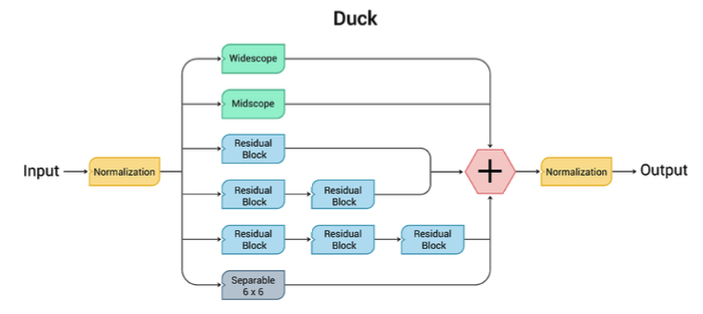
<center> Duck Block </center>


In [19]:
# Duck-Net의 핵심 함수

def duckv2_conv2D_block(x, filters, size):
    x = BatchNormalization(axis=-1)(x) # 입력 먼저 정규화
    
    x1 = widescope_conv2D_block(x, filters) # dilation 1~3

    x2 = midscope_conv2D_block(x, filters) # dilation 1~2

    x3 = conv_block_2D(x, filters, 'resnet', repeat=1)

    x4 = conv_block_2D(x, filters, 'resnet', repeat=2)

    x5 = conv_block_2D(x, filters, 'resnet', repeat=3)

    x6 = separated_conv2D_block(x, filters, size=6, padding='same') # kernel을 나눠서 학습

    x = add([x1, x2, x3, x4, x5, x6]) # 모든 결과 add

    x = BatchNormalization(axis=-1)(x) # 다시 정규화

    return x


커널을 세로 `(1, size)`, 가로 `(size, 1)`로 분리해서 연산하는 방식\
일반적인 `(size, size)` 커널보다 계산량이 적으면서도 비슷한 효과를 낼 수 있어서 효율적\
Depthwise Separable Conv랑은 다르지만 개념은 비슷한 방향

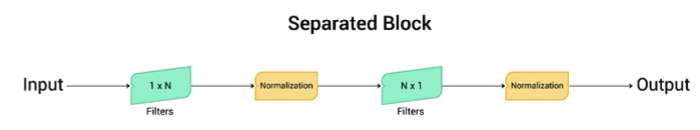
<center> Separated Block </center>

In [20]:
# 커널 분리 함수

def separated_conv2D_block(x, filters, size=3, padding='same'):
    x = Conv2D(filters, (1, size), activation='relu', kernel_initializer=kernel_initializer, padding=padding)(x)

    x = BatchNormalization(axis=-1)(x)

    x = Conv2D(filters, (size, 1), activation='relu', kernel_initializer=kernel_initializer, padding=padding)(x)

    x = BatchNormalization(axis=-1)(x)

    return x


중간 수준의 `receptive field` 확보용 블록 \
dilation rate를 `1 → 2`로 점점 늘리면서 필터가 더 넓은 영역을 커버하도록 설계\
`receptive field`는 넓히되 과하게 크지 않게 중간 정도의 패턴을 잡기 위한 구조

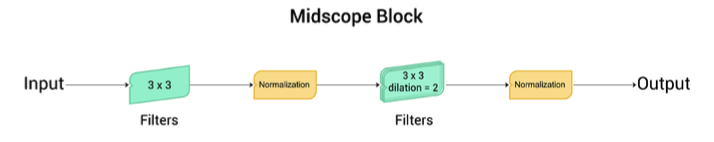
<center>Midscope Block</center>

In [21]:
# receptive field 확보 블록

def midscope_conv2D_block(x, filters):
    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=1)(x)

    x = BatchNormalization(axis=-1)(x)

    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=2)(x)

    x = BatchNormalization(axis=-1)(x)

    return x


넓은 영역에서 특징을 추출하기 위한 블록 \
dilation rate를 `1 → 2 → 3`으로 점점 확대해서 여러 크기의 패턴을 동시에 인식할 수 있게 해줌 \
멀리 떨어진 픽셀 간의 관계까지 파악하고 싶을 때 유용

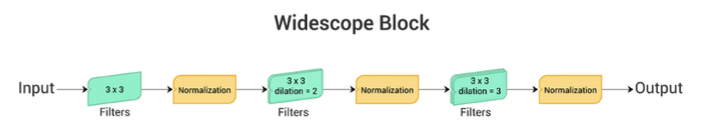
<center>Widescope Block</center>

In [22]:
# widescope의 컨벌루션 블록

def widescope_conv2D_block(x, filters):
    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=1)(x)

    x = BatchNormalization(axis=-1)(x)

    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=2)(x)

    x = BatchNormalization(axis=-1)(x)

    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=3)(x)

    x = BatchNormalization(axis=-1)(x)

    return x


ResNet 스타일의 블록으로 입력을 그대로 skip connection으로 넘겨서 출력과 더해주는 구조 \
깊은 네트워크에서도 gradient가 잘 흐르도록 돕고 학습이 안정적 \
dilation rate도 조절 가능해서 범위도 확장 가능

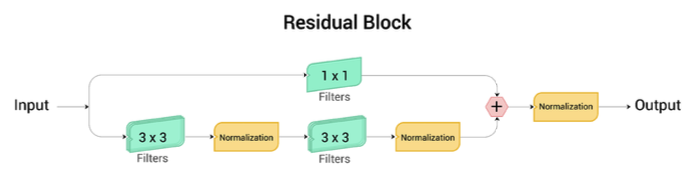
<center>Resnet Block</center>

In [23]:
# ResNet 블록

def resnet_conv2D_block(x, filters, dilation_rate=1):
    x1 = Conv2D(filters, (1, 1), activation='relu', kernel_initializer=kernel_initializer, padding='same',
                dilation_rate=dilation_rate)(x) # identity 경로

    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=dilation_rate)(x)
    x = BatchNormalization(axis=-1)(x)
    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=dilation_rate)(x)
    x = BatchNormalization(axis=-1)(x)
    
    x_final = add([x, x1]) # skip connection 적용

    x_final = BatchNormalization(axis=-1)(x_final)

    return x_final


가장 기본적인 컨볼루션 블록 \
Conv-BN 구조를 두 번 반복한 형태로 U-Net 계열 구조에서 자주 쓰임 \
dilation도 조정 가능해서 `receptive field` 확장도 가능

In [24]:
# 컨벌루션 블록

def double_convolution_with_batch_normalization(x, filters, dilation_rate=1):
    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=dilation_rate)(x)
    x = BatchNormalization(axis=-1)(x)
    x = Conv2D(filters, (3, 3), activation='relu', kernel_initializer=kernel_initializer, padding='same',
               dilation_rate=dilation_rate)(x)
    x = BatchNormalization(axis=-1)(x)

    return x


### Duck-Net 모델 정의

Duck-Net의 전체 모델을 구성하는 함수 \
U-Net 처럼 인코더 - 디코더 구조로 이뤄짐 

**인코더**

- 입력 이미지에서 점점 해상도를 줄이면서 필터 수는 늘려감
- 각 단계에서 duckv2 블록을 사용해서 다양한 범위의 특성을 추출
- `Conv2D(stride=2)`를 통해 다운샘플링 수행

**Bottleneck**

- 가장 깊은 단계에서 ResNet 블록을 여러 번 사용해서 특징을 압축하고 학습
- 여러 개의 dilation conv를 통해 정보 손실 줄이기 위한 구조


**디코더**

- `업샘플링 → skip connection → duckv2` 블록
- 점점 해상도를 복구하면서 인코더의 출력들과 skip 연결하여 정보 보존
- interpolation 방식은 `nearest`로 가장 간단하면서 빠른 업샘플링 사용

이러한 구조를 통해 다양한 convolution 블록 조합으로 복잡한 패턴을 잘 잡아냄 \
특히 의료 영상처럼 작은 변화가 중요한 데이터에서 유리함

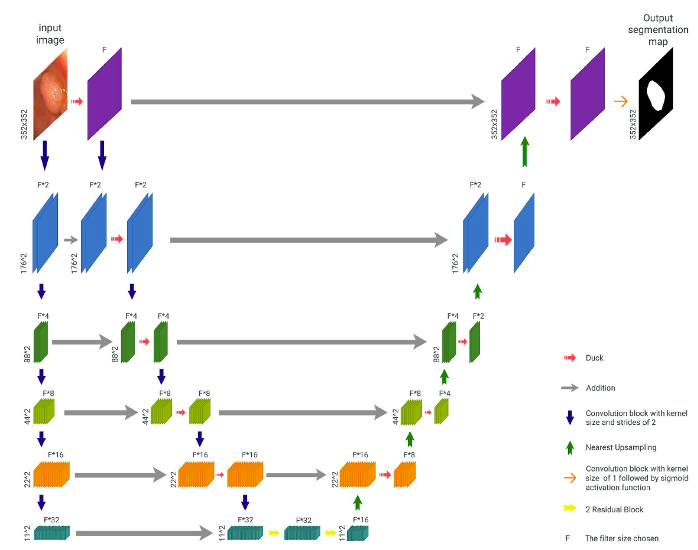
<center>Duck-Net</center>


In [25]:
# 라이브러리 정의

import tensorflow as tf
from keras.layers import Conv2D, UpSampling2D
from keras.layers import add # skip connection을 위한 add 연산
from keras.models import Model # 전체 모델 구성용 라이브러리

kernel_initializer = 'he_uniform' # 커널 초기화 방식
interpolation = "nearest" # 업샘플링 방식

In [26]:
# Duck-Net 모델 정의

def create_model(img_height, img_width, input_chanels, out_classes, starting_filters):
    input_layer = tf.keras.layers.Input((img_height, img_width, input_chanels)) # 모델 입력 정의

    print('Starting DUCK-Net')
    
    # 기본 U-Net처럼 입력을 다운샘플링만 한 피처맵 생성 (Residual 연결용)
    p1 = Conv2D(starting_filters * 2, 2, strides=2, padding='same')(input_layer)
    p2 = Conv2D(starting_filters * 4, 2, strides=2, padding='same')(p1)
    p3 = Conv2D(starting_filters * 8, 2, strides=2, padding='same')(p2)
    p4 = Conv2D(starting_filters * 16, 2, strides=2, padding='same')(p3)
    p5 = Conv2D(starting_filters * 32, 2, strides=2, padding='same')(p4)
    
    # 인코더 시작 (duckv2 블록 사용)
    t0 = conv_block_2D(input_layer, starting_filters, 'duckv2', repeat=1)

    l1i = Conv2D(starting_filters * 2, 2, strides=2, padding='same')(t0)
    s1 = add([l1i, p1]) # skip connection
    t1 = conv_block_2D(s1, starting_filters * 2, 'duckv2', repeat=1)

    l2i = Conv2D(starting_filters * 4, 2, strides=2, padding='same')(t1)
    s2 = add([l2i, p2])
    t2 = conv_block_2D(s2, starting_filters * 4, 'duckv2', repeat=1)

    l3i = Conv2D(starting_filters * 8, 2, strides=2, padding='same')(t2)
    s3 = add([l3i, p3])
    t3 = conv_block_2D(s3, starting_filters * 8, 'duckv2', repeat=1)

    l4i = Conv2D(starting_filters * 16, 2, strides=2, padding='same')(t3)
    s4 = add([l4i, p4])
    t4 = conv_block_2D(s4, starting_filters * 16, 'duckv2', repeat=1)

    # bottleneck
    l5i = Conv2D(starting_filters * 32, 2, strides=2, padding='same')(t4)
    s5 = add([l5i, p5])
    t51 = conv_block_2D(s5, starting_filters * 32, 'resnet', repeat=2)
    t53 = conv_block_2D(t51, starting_filters * 16, 'resnet', repeat=2)

    # 디코더 시작 (업샘플링 + skip 연결 + duck 블록)
    l5o = UpSampling2D((2, 2), interpolation=interpolation)(t53)
    c4 = add([l5o, t4])
    q4 = conv_block_2D(c4, starting_filters * 8, 'duckv2', repeat=1)

    l4o = UpSampling2D((2, 2), interpolation=interpolation)(q4)
    c3 = add([l4o, t3])
    q3 = conv_block_2D(c3, starting_filters * 4, 'duckv2', repeat=1)

    l3o = UpSampling2D((2, 2), interpolation=interpolation)(q3)
    c2 = add([l3o, t2])
    q6 = conv_block_2D(c2, starting_filters * 2, 'duckv2', repeat=1)

    l2o = UpSampling2D((2, 2), interpolation=interpolation)(q6)
    c1 = add([l2o, t1])
    q1 = conv_block_2D(c1, starting_filters, 'duckv2', repeat=1)

    l1o = UpSampling2D((2, 2), interpolation=interpolation)(q1)
    c0 = add([l1o, t0])
    z1 = conv_block_2D(c0, starting_filters, 'duckv2', repeat=1)

    # 출력층: 1x1 Conv → 클래스 수 만큼 채널, 시그모이드 활성화
    output = Conv2D(out_classes, (1, 1), activation='sigmoid')(z1)

    model = Model(inputs=input_layer, outputs=output)

    return model

## 모델 학습

이 코드는 실제로 DuckNet 모델을 인스턴스화하고 컴파일하는 단계

- `create_model()` : DuckNet 구조를 구성해서 Keras Model 객체로 반환
- `img_size` : 앞에서 정한 입력 이미지 크기 (예: 352x352)
- `input_chanels=3` : RGB 이미지 입력
- `out_classes=1` : 출력은 1채널, 픽셀마다 폴립일 확률(0~1)을 예측
- `starting_filters` : 처음 convolution에서 사용할 필터 수 (보통 17 또는 34)

compile() 단계

- 최적화 알고리즘(RMSprop)을 설정
- 손실 함수로 dice_metric_loss를 사용해서 모델이 픽셀 단위로 분할 성능을 최대화하도록 학습

In [27]:
# Duck-Net 모델 생성

model = create_model(
    img_height=img_size,
    img_width=img_size,
    input_chanels=3, # RGB 이미지
    out_classes=1, # binary segmentation
    starting_filters=filters
)


Starting DUCK-Net


In [28]:
# 모델 컴파일

model.compile(optimizer=optimizer, loss=dice_metric_loss) # 커스텀 Dice Loss 사용


`model.fit()` 대신 직접 epoch 단위로 증강, 학습, 평가, 저장까지 관리하는 커스텀 학습 루프

1. `augment_images()`로 매 epoch마다 새로운 증강된 데이터를 생성
2. `model.fit()`으로 1 epoch만 학습하고, validation set으로 평가
3. `model.predict()`를 사용해 validation과 test 성능을 dice loss로 직접 측정
4. 성능이 이전보다 좋아지면 `model.save()`로 모델을 저장
5. 학습 로그는 .csv와 .txt 두 파일로 따로 저장
6. 매 epoch마다 메모리를 정리해줌 (`del, gc.collect()`)


- 매 epoch마다 다른 증강 데이터를 학습에 사용해서 일반화 성능을 높임
- dice_metric_loss를 직접 검증/테스트에 사용해서 일관된 지표로 관리
- min_loss_for_saving을 기준으로 성능이 가장 좋은 모델만 저장

In [29]:
# 학습 루프 구현

from tensorflow.keras import backend as K

step = 0 # 학습 루프 카운터

for epoch in range (0, EPOCHS):
    
    print(f'Training, epoch {epoch}')
    print('Learning Rate: ' + str(learning_rate))

    step += 1
    
    # 증강된 학습 데이터 생성    
    image_augmented, mask_augmented = augment_images()
    
    # 학습 로그를 csv로 저장
    csv_logger = CSVLogger(progress_path, append=True, separator=';')
    
    # 모델 학습
    model.fit(
        x=image_augmented,
        y=mask_augmented,
        epochs=1,
        batch_size=4,
        validation_data=(x_valid, y_valid),
        verbose=1,
        callbacks=[csv_logger]
    )
    
    
    # 검증 손실 계산
    prediction_valid = model.predict(x_valid, verbose=0)
    loss_valid = dice_metric_loss(y_valid, prediction_valid)
    loss_valid = loss_valid.numpy()
    print("Loss Validation: " + str(loss_valid))
    
    # 테스트 손실 계산    
    prediction_test = model.predict(x_test, verbose=0)
    loss_test = dice_metric_loss(y_test, prediction_test)
    loss_test = loss_test.numpy()
    print("Loss Test: " + str(loss_test))
    
    # 전체 로그 텍스트 파일에 저장    
    with open(progressfull_path, 'a') as f:
        f.write('epoch: ' + str(epoch) + '\nval_loss: ' + str(loss_valid) + '\ntest_loss: ' + str(loss_test) + '\n\n\n')
    
    # 가장 낮은 val loss 기준으로 모델 저장
    if min_loss_for_saving > loss_valid:
        min_loss_for_saving = loss_valid
        print("Saved model with val_loss: ", loss_valid)
        model.save(model_path)
        
    del image_augmented
    del mask_augmented

    gc.collect()

Training, epoch 0
Learning Rate: 0.0001


2025-04-09 06:34:51.976411: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8906
2025-04-09 06:34:59.221050: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f80c1537d30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-04-09 06:34:59.221122: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA A100 80GB PCIe, Compute Capability 8.0
2025-04-09 06:34:59.895108: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:255] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-04-09 06:35:00.783829: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


200/200 [==============================] - ETA: 0s - loss: 0.6598

2025-04-09 06:37:09.495797: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


200/200 [==============================] - 189s 279ms/step - loss: 0.6598 - val_loss: 0.6200
Loss Validation: 0.6117169
Loss Test: 0.6454867
Training, epoch 1
Learning Rate: 0.0001
200/200 [==============================] - 51s 253ms/step - loss: 0.6065 - val_loss: 0.5576
Loss Validation: 0.54531455
Loss Test: 0.5735874
Saved model with val_loss:  0.54531455
INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


Training, epoch 2
Learning Rate: 0.0001
200/200 [==============================] - 50s 250ms/step - loss: 0.5777 - val_loss: 0.4828
Loss Validation: 0.46978223
Loss Test: 0.50411344
Saved model with val_loss:  0.46978223
INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


Training, epoch 3
Learning Rate: 0.0001
200/200 [==============================] - 50s 251ms/step - loss: 0.5563 - val_loss: 0.4855
Loss Validation: 0.4749601
Loss Test: 0.47518373
Training, epoch 4
Learning Rate: 0.0001
200/200 [==============================] - 50s 251ms/step - loss: 0.5359 - val_loss: 0.4658
Loss Validation: 0.45457196
Loss Test: 0.4771976
Saved model with val_loss:  0.45457196
INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


Training, epoch 5
Learning Rate: 0.0001
200/200 [==============================] - 50s 252ms/step - loss: 0.5263 - val_loss: 0.4741
Loss Validation: 0.46563274
Loss Test: 0.4854573
Training, epoch 6
Learning Rate: 0.0001
200/200 [==============================] - 51s 253ms/step - loss: 0.5129 - val_loss: 0.4337
Loss Validation: 0.42631108
Loss Test: 0.4543336
Saved model with val_loss:  0.42631108
INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


Training, epoch 7
Learning Rate: 0.0001
200/200 [==============================] - 50s 252ms/step - loss: 0.5002 - val_loss: 0.4268
Loss Validation: 0.413881
Loss Test: 0.4365884
Saved model with val_loss:  0.413881
INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


Training, epoch 8
Learning Rate: 0.0001
200/200 [==============================] - 50s 252ms/step - loss: 0.4919 - val_loss: 0.4075
Loss Validation: 0.39990854
Loss Test: 0.41749644
Saved model with val_loss:  0.39990854
INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


INFO:tensorflow:Assets written to: ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307/assets


Training, epoch 9
Learning Rate: 0.0001
200/200 [==============================] - 50s 252ms/step - loss: 0.4879 - val_loss: 0.4526
Loss Validation: 0.44410658
Loss Test: 0.4388529


# 모델 실험 결과

### 예측 및 성능 평가

`model_path` 경로에서 학습된 모델 파일을 불러옴 \
`dice_metric_loss`는 사용자 정의 손실 함수이기 때문에 `custom_objects`에 같이 넘겨줘야 로딩 가능

In [31]:
# 저장된 모델 로드

print("Loading the model")

model = tf.keras.models.load_model(model_path, custom_objects={'dice_metric_loss':dice_metric_loss})


Loading the model


학습용 데이터셋에 대해 예측 수행 \
결과는 0~1 사이 확률값으로 구성된 마스크 형태 \
검증용, 테스트용 데이터셋에 대해서도 동일하게 예측 수행 

In [32]:
# 모델 예측 수행

prediction_train = model.predict(x_train, batch_size=4)
prediction_valid = model.predict(x_valid, batch_size=4)
prediction_test = model.predict(x_test, batch_size=4)

print("Predictions done")


25/25 [==============================] - 2s 76ms/step
Predictions done


실제 마스크(`y_train`)와 예측 결과(`prediction_train`)를 비교해서 Dice 점수 계산 \
`prediction > 0.5`는 threshold 적용해서 확률값을 0 또는 1로 바꿔주는 작업 \
`.flatten()`은 2차원 이미지를 1차원으로 변환해서 sklearn이 처리 가능하도록 만듦 \
검증, 테스트 세트에 대해서도 같은 방식으로 Dice 계수 계산

In [33]:
# Dice (F1-score 기반) 계산

dice_train = f1_score(np.ndarray.flatten(np.array(y_train, dtype=bool)),
                           np.ndarray.flatten(prediction_train > 0.5))
dice_test = f1_score(np.ndarray.flatten(np.array(y_test, dtype=bool)),
                          np.ndarray.flatten(prediction_test > 0.5))
dice_valid = f1_score(np.ndarray.flatten(np.array(y_valid, dtype=bool)),
                           np.ndarray.flatten(prediction_valid > 0.5))

print("Dice finished")


Dice finished


`Mean IoU` : 예측과 실제의 교집합 / 합집합 \
세그멘테이션 정확도 측정에 자주 사용되는 지표

In [34]:
# Mean IoU 계산

miou_train = jaccard_score(np.ndarray.flatten(np.array(y_train, dtype=bool)),
                           np.ndarray.flatten(prediction_train > 0.5))
miou_test = jaccard_score(np.ndarray.flatten(np.array(y_test, dtype=bool)),
                          np.ndarray.flatten(prediction_test > 0.5))
miou_valid = jaccard_score(np.ndarray.flatten(np.array(y_valid, dtype=bool)),
                           np.ndarray.flatten(prediction_valid > 0.5))

print("Miou finished")


Miou finished


모델이 positive(용종) 라고 예측한 것 중 실제로 맞춘 비율 \
false positive에 민감한 지표

In [35]:
# Precision 계산

precision_train = precision_score(np.ndarray.flatten(np.array(y_train, dtype=bool)),
                                  np.ndarray.flatten(prediction_train > 0.5))
precision_test = precision_score(np.ndarray.flatten(np.array(y_test, dtype=bool)),
                                 np.ndarray.flatten(prediction_test > 0.5))
precision_valid = precision_score(np.ndarray.flatten(np.array(y_valid, dtype=bool)),
                                  np.ndarray.flatten(prediction_valid > 0.5))

print("Precision finished")


Precision finished


실제 positive 중에서 얼마나 잘 맞췄는지 \
false negative에 민감한 지표 (진짜 용종을 놓치지 않는 능력)

In [ ]:
# Recall 계산

recall_train = recall_score(np.ndarray.flatten(np.array(y_train, dtype=bool)),
                            np.ndarray.flatten(prediction_train > 0.5))
recall_test = recall_score(np.ndarray.flatten(np.array(y_test, dtype=bool)),
                           np.ndarray.flatten(prediction_test > 0.5))
recall_valid = recall_score(np.ndarray.flatten(np.array(y_valid, dtype=bool)),
                            np.ndarray.flatten(prediction_valid > 0.5))

print("Recall finished")


전체 픽셀 중에서 얼마나 맞췄는지 비율 \
클래스 불균형이 큰 세그멘테이션 문제에서는 단독으로 쓰기엔 신뢰도 떨어질 수 있음

In [34]:
# Accuracy 계산

accuracy_train = accuracy_score(np.ndarray.flatten(np.array(y_train, dtype=bool)),
                                np.ndarray.flatten(prediction_train > 0.5))
accuracy_test = accuracy_score(np.ndarray.flatten(np.array(y_test, dtype=bool)),
                               np.ndarray.flatten(prediction_test > 0.5))
accuracy_valid = accuracy_score(np.ndarray.flatten(np.array(y_valid, dtype=bool)),
                                np.ndarray.flatten(prediction_valid > 0.5))


print("Accuracy finished")


Accuracy finished


In [35]:
# 결과 저장 파일 이름 생성

final_file = 'results_' + model_type + '_' + str(filters) + '_' + dataset_type + '.txt'
print(final_file)


results_DuckNet_17_kvasir.txt


`각 지표별로 train/valid/test 성능을 텍스트 파일에 저장`

In [36]:
# 평가 결과 저장

with open(final_file, 'a') as f:
    f.write(dataset_type + '\n\n')
    f.write('dice_train: ' + str(dice_train) + ' dice_valid: ' + str(dice_valid) + ' dice_test: ' + str(dice_test) + '\n\n')
    f.write('miou_train: ' + str(miou_train) + ' miou_valid: ' + str(miou_valid) + ' miou_test: ' + str(miou_test) + '\n\n')
    f.write('precision_train: ' + str(precision_train) + ' precision_valid: ' + str(precision_valid) + ' precision_test: ' + str(precision_test) + '\n\n')
    f.write('recall_train: ' + str(recall_train) + ' recall_valid: ' + str(recall_valid) + ' recall_test: ' + str(recall_test) + '\n\n')
    f.write('accuracy_train: ' + str(accuracy_train) + ' accuracy_valid: ' + str(accuracy_valid) + ' accuracy_test: ' + str(accuracy_test) + '\n\n\n\n')

print('File done')


File done


### 예측 결과 시각화

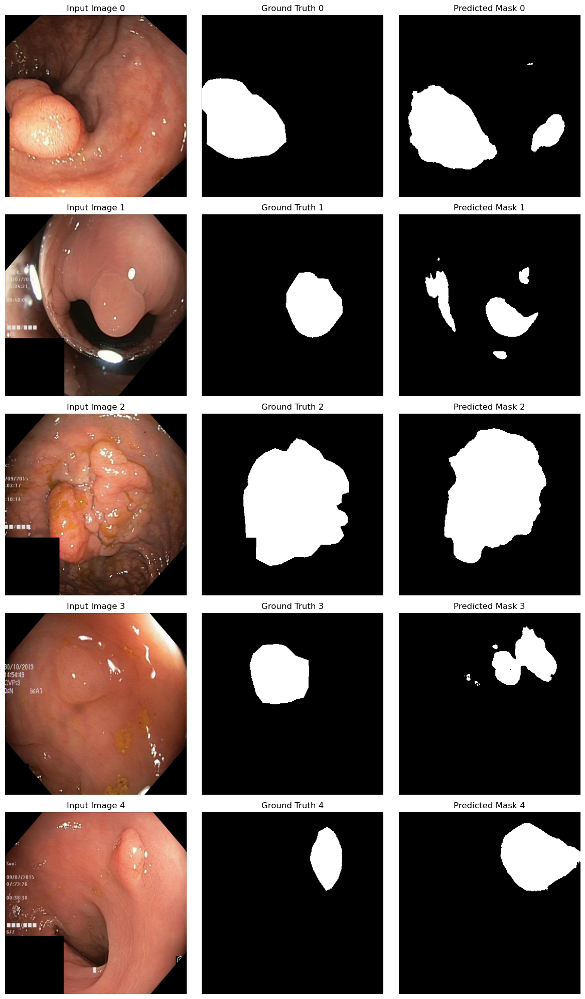

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model


# 모델 로드 --> 로드된 경로로 입력하셔야 됩니다.
model_path = '/home/elicer/ModelSaveTensorFlow/kvasir/DuckNet_filters_17_2025-04-09 06:16:13.417307'
model = load_model(model_path, custom_objects={'dice_metric_loss': dice_metric_loss})

# 몇 개 이미지 시각화할지
num_samples = 5

plt.figure(figsize=(12, num_samples * 4))

for idx in range(num_samples):
    input_image = x_test[idx]
    input_mask = y_test[idx]
    input_image_batch = np.expand_dims(input_image, axis=0)

    predicted_mask = model.predict(input_image_batch, verbose=0)[0]
    predicted_mask_binary = (predicted_mask > 0.5).astype(np.uint8)

    # Row마다 Input / GT / Predicted
    plt.subplot(num_samples, 3, idx * 3 + 1)
    plt.imshow(input_image)
    plt.title(f"Input Image {idx}")
    plt.axis('off')

    plt.subplot(num_samples, 3, idx * 3 + 2)
    plt.imshow(input_mask.squeeze(), cmap='gray')
    plt.title(f"Ground Truth {idx}")
    plt.axis('off')

    plt.subplot(num_samples, 3, idx * 3 + 3)
    plt.imshow(predicted_mask_binary.squeeze(), cmap='gray')
    plt.title(f"Predicted Mask {idx}")
    plt.axis('off')

plt.tight_layout()
plt.show()

### 손실 함수 시각화

pandas 라이브러리가 필요해 pip install pandas 명령어로 설치 필요

로그 열: Index(['epoch', 'loss', 'val_loss'], dtype='object')


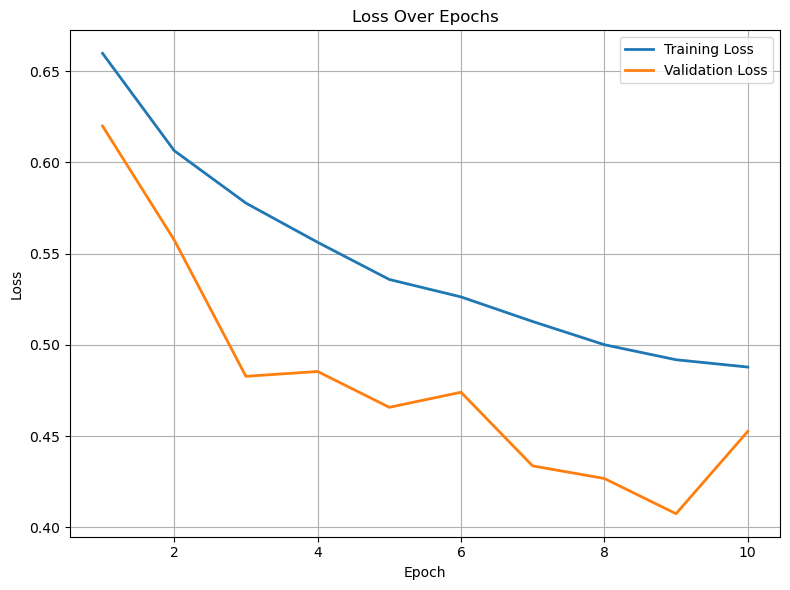

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

# 로그 경로 (CSVLogger로 저장된 로그)
log_path = progress_path 

# 읽기 (구분자 ; 사용)
history_df = pd.read_csv(log_path, sep=';')

# 로그 내용 확인
print("로그 열:", history_df.columns)

# epoch 수 추정
epochs = list(range(1, len(history_df) + 1))  # 직접 생성: 1, 2, 3, ...

# 손실 그래프
plt.figure(figsize=(8, 6))
plt.plot(epochs, history_df['loss'], label='Training Loss', linewidth=2)

if 'val_loss' in history_df.columns:
    plt.plot(epochs, history_df['val_loss'], label='Validation Loss', linewidth=2)

plt.title('Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


## 결과 분석

사진은 실제 논문에서 Duck-Net 을 학습 시켜 결과를 얻고 기존의 사용되던 의료 세그멘테이션 모델들의 결과와 비교한 사진

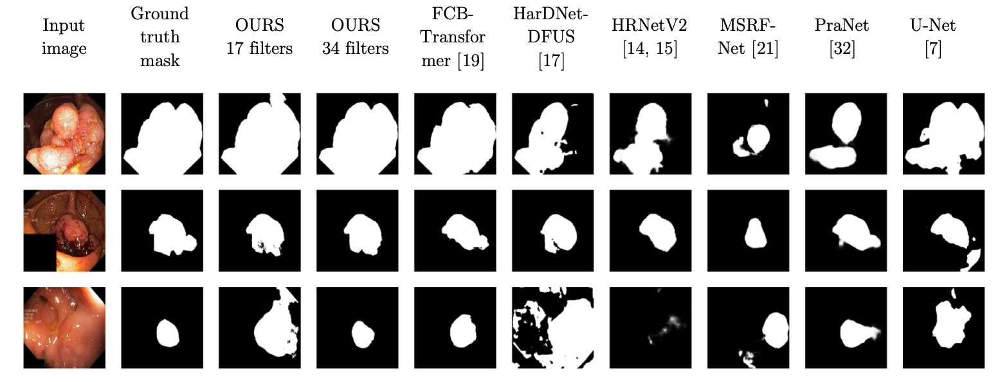
<center>실험결과</center>  


논문의 하이퍼파라미터
- Epoch 수: 600
- Batch size: 4
- Optimizer: RMSprop
- Learning rate: 0.0001
- 입력 이미지 크기: 352 × 352 
- 프레임워크: TensorFlow
- GPU 환경: NVIDIA A100 GPU
- 손실 함수: Dice Loss

논문의 하이퍼 파라미터를 보면 Epoch의 수가 600 인걸 볼 수 있지만 현재 환경에서 Epoch 수를 10으로만 했을 때도 결과가 나쁘지 않음을 알 수 있음\
이를 통해 Duck-Net이 적은 학습량 및 적은 데이터 수에도 특화된 성능이 있음을 알 수 있고 이는 실제 현장에서도 사용 가능함을 시사함

# 결론

## 주요 업적

1. 새로운 CNN 기반의 세그멘테이션 아키텍처 제안

    - 기존 U-Net 아키텍처를 기반으로 하되 Residual Downsampling 구조와 DUCK(Deep Understanding Convolutional Kernel) 블록을 도입하여 정확한 경계 예측 및 다양한 크기/형태의 용종 인식에 강한 성능을 보임  
<br>
2. DUCK 블록 설계 및 병렬 커널 처리

    - Residual, Midscope, Widescope, Separated 블록 등 여섯 가지 커널 구조를 병렬로 조합한 DUCK 블록을 개발하여, 네트워크가 다양한 스케일의 특징(feature)을 효율적으로 학습할 수 있도록 함
<br>
3. 사전학습 없이도 고성능 구현

    - 사전학습(pre-training) 없이도 뛰어난 정확도를 달성하여 대규모 외부 데이터 없이도 소규모 의료 데이터로 효과적인 학습과 일반화가 가능함을 입증
<br>
4. 다양한 벤치마크 데이터셋에서 SOTA 성능 달성

    - Kvasir-SEG, CVC-ClinicDB, CVC-ColonDB, ETIS-LARIBPOLYPDB 등 4개 주요 공개 데이터셋에서 Dice Score, Jaccard Index, Precision, Recall, Accuracy 기준으로 기존 모델 대비 우수한 성능을 기록
    
    - 특히 34 필터 구성에서는 대부분의 지표에서 최고 성능을 달성함
<br>
5. Cross-dataset 실험을 통한 일반화 성능 검증

    - 한 데이터셋에서 학습한 모델을 다른 데이터셋에 테스트하는 크로스-도메인 실험을 통해 DUCK-Net의 우수한 일반화 능력을 실증함
    - 이는 실제 임상 데이터에 적용 가능성을 높이는 중요한 성과
<br>
6. 연산 효율성과 정확도의 균형

    - Concatenation 대신 Add 연산을 사용하여 메모리 사용량과 연산량을 절감하면서도 정확도를 유지하는 등 경량화 설계를 통해 실제 의료 현장에서의 적용성을 고려함

## 기존 연구와의 차별점

DUCK-Net은 기존의 의료 영상 세그멘테이션 모델들과 여러 면에서 뚜렷한 차별점을 지님     
우선 구조적인 측면에서 대부분의 기존 모델들이 사용하는 기본적인 U-Net 형태의 인코더-디코더 구조를 바탕으로 하면서도 `DUCK-Net은 Residual Downsampling` 기법과 DUCK 블록이라는 고유한 커널 처리 방식을 결합하여 다중 스케일의 정보를 동시에 효과적으로 학습할 수 있도록 설계됨

기존 모델들은 대개 `단일 커널 크기(예: 3×3 또는 5×5)의 일반적인 합성곱 연산(convolution)` 을 반복하거나 `skip connection`을 통해 고해상도 정보를 복원하는 방식에 그침    
반면 DUCK-Net은 `Residual, Midscope, Widescope, Separated 블록` 등 서로 다른 커널 구조를 병렬로 결합한 DUCK 블록을 사용함으로써 로우레벨(경계, 질감 등)과 하이레벨(형태, 위치 등)의 특징을 동시에 추출할 수 있게 함

기존의 많은 최신 모델들, 특히 Transformer 기반 모델(예: FCN-Transformer, ColonFormer 등)이나 PraNet 등은 **사전학습(pre-training)** 을 통해 대규모 외부 데이터에서 학습된 정보를 기반으로 성능을 끌어올리지만    
DUCK-Net은 사전학습 없이도 다양한 데이터셋에서 기존 모델들을 능가하는 성능을 보여주며 의료 현장에서 데이터가 부족한 경우에도 실질적인 활용 가능성을 보여줌

뿐만 아니라 대부분의 기존 모델들은 `skip connection` 결합 시 `concatenation(연결)` 방식을 사용해 연산량이 많고 메모리 사용량이 높은 반면 DUCK-Net은 add 연산을 적용하여 연산 효율성과 정확도 간의 균형을 이룬 경량화 구조를 구현   
이로 인해 실제 임베디드 시스템이나 병원 내 실시간 분석 환경에서도 보다 적은 자원으로 고성능을 구현할 수 있음

## 기술적 한계

1. 경계 인식 한계 (Edge Prediction)
    - DUCK-Net은 폴립의 다양한 모양과 크기를 잘 처리하지만 배경과 색상이 유사한 폴립의 경우 경계 인식 성능이 다소 저하되는 한계가 있음
    - 특히 영상의 질이 낮거나 조명이 불균형한 경우 정확한 세그멘테이션 결과를 얻기 어려울 수 있음    

2. 연산 복잡도 증가
    - DUCK 블록은 다양한 커널을 병렬로 적용해 풍부한 정보를 추출하지만 이로 인해 모델의 연산량과 메모리 사용량이 증가하게 됨
    - 실시간 처리를 요구하는 환경이나 임베디드 시스템에서는 최적화가 필요함     

3. 대규모 실제 임상 데이터에 대한 검증 부족
    - 논문에서는 4개의 공개된 폴립 데이터셋(Kvasir-SEG, CVC-ClinicDB 등)을 활용해 성능을 검증했으나 다양한 병원 환경에서 수집된 실제 임상 데이터에 대한 테스트는 부족함
    - 실제 임상 상황에서는 더 복잡하고 다양한 조건들이 존재하므로 모델의 일반화 성능을 검증할 필요가 있음

## 향후 연구 과제

1. 모델 경량화 및 실시간 처리 최적화
    - DUCK 블록의 병렬 구조를 유지하면서도 모델 파라미터 수를 줄이고 연산 최적화하는 경량화 연구가 필요함
    - 예: Knowledge Distillation, Quantization, Pruning 등을 활용한 최적화 전략 도입 가능     

2. Self-supervised / Semi-supervised 학습 적용
    - 의료 영상 분야는 정확한 라벨링이 어려운 경우가 많기 때문에 라벨 없는 데이터에서도 학습 가능한 self-supervised 또는 semi-supervised 학습 기법을 DUCK-Net에 적용하는 연구가 유의미함     

3. 다기관 및 다국적 데이터셋을 활용한 검증
    - 다양한 장비, 환경, 인종 및 의료기관 조건에서 수집된 다양한 실세계 데이터셋을 통한 모델의 일반화 성능 검증이 향후 필수 과제가 될 수 있음     
    
4. 다른 의료 영상 분야로의 확장
    - 현재는 대장 내시경 영상에 한정되어 있지만 DUCK-Net의 구조는 간, 폐, 피부 병변 등 다른 장기나 질환의 영상 분석에도 확장 가능성이 높음
    - 각기 다른 병변 특성에 맞춘 커스터마이징 연구 필요